In [2]:
# Imports
import os
import time

# import methods from FIA python script
from FIA import *

In [3]:
# Runtime-estimation
start = time.time()

## Read in

In [4]:
# set path to your mzML files and workfolder
data_dir = "../../data/example data/exampleA_ecolistrains"
run_dir = "../../runs/FIA/fia_explorer"

data_dir = os.path.normpath(os.path.join(os.getcwd(), data_dir))
run_dir = os.path.normpath(os.path.join(os.getcwd(), run_dir))

# clean_dir(run_dir)

## Trimming
Discarding values below cutoff

In [8]:
trim_dir = trim_threshold_batch(data_dir, run_dir, file_ending=".mzXML", threshold=1e3, deepcopy=False)

100%|██████████| 6/6 [00:00<?, ?it/s]


100%|██████████| 6/6 [00:01<00:00,  4.22it/s]


## Centroiding

- signal_to_noise (Default: 1.0)
    - Signal to noise value, each peak is required to be above this value (turn off by setting it to 0.0)
- peak_width (Default: 0.0)
    - Expected peak width half width in Dalton - peaks will be extended until this half width is reached (even if the intensitity is increasing). In conjunction with check_width_internally it will also be used to remove peaks whose spacing is larger than this value.
- spacing_difference (Default: 1.5)
    - Difference between peaks in multiples of the minimal difference to continue. The higher this value is set, the further apart peaks are allowed to be to still extend a peak. E.g. if the value is set to 1.5 and in a current peak the minimal spacing between peaks is 10 mDa, then only peaks at most 15 mDa apart will be added to the peak.
- sn_bin_count (Default: 30)
    - Bin count for the Signal to Noise estimation.
- nr_iterations (Default: 5)
    - Nr of iterations to perform (how many times the peaks are re-centered).
- sn_win_len (Default: 20.0)
    - Window length for the Signal to Noise estimation.
- check_width_internally (Default: false)
    - Delete peaks where the spacing is larger than the peak width (should be set to true to avoid artefacts)
- ms1_only (Default: false)
    - Only do MS1
- clear_meta_data (Default: false)

In [9]:
centroid_dir = centroid_batch(trim_dir, run_dir, file_ending=".mzML", instrument="TOF",
                                signal_to_noise=2.0, spacing_difference=1.5,
                                peak_width=0.0, sn_bin_count=100, nr_iterations=5, sn_win_len=20.0,
                                check_width_internally="false", ms1_only="true", clear_meta_data="false",
                                deepcopy=False)
# centroid_dir = os.path.join(run_dir, "centroids")

  0%|          | 0/6 [00:00<?, ?it/s]

100%|██████████| 6/6 [00:05<00:00,  1.00it/s]


## Merging
- block_method: Summing up
- The gaussian method performs weighted average over the neighbouring spectra with weights having the shape of gaussian shape (i.e., sharply decreasing from the center). 
- On the other hand, the tophat method, as the name implies, performs a simple averaging over the neighbouring spectra.if tuned
- precursor_method: Needs MS2 data

- mz_binning_width' (Default: 5.0)
    - minimum m/z distance for two data points (profile data) or peaks (centroided data) to be considered distinct. Closer data points or peaks will be merged.
- mz_binning_width_unit' (Default: ppm)
    - Unit in which the distance between two data points or peaks is given.
- sort_blocks' (Default: RT_ascending)
    - Sort blocks by <?> before merging them (useful for precursor order)
- average_gaussian:spectrum_type' (Default: automatic)
    - Spectrum type of the MS level to be averaged
- average_gaussian:ms_level' (Default:  1)
    - If set to be 0, each MS level will be merged from 1 to max. Otherwise, average spectra of this level. All other spectra remain unchanged.
- average_gaussian:rt_FWHM' (Default:  5.0)
    - FWHM of Gauss curve in seconds to be averaged over.
- average_gaussian:cutoff' (Default:  0.01)
    - Intensity cutoff for Gaussian. The Gaussian RT profile decreases from 1 at its apex to 0 at infinity. Spectra for which the intensity of the Gaussian drops below the cutoff do not contribute to the average.
- average_gaussian:precursor_mass_tol' (Default:  0.0)   
    - PPM mass tolerance for precursor mass. If set, MSn (n>2) spectra of precursor masses within the tolerance are averaged.
- average_gaussian:precursor_max_charge' (Default:  1)
    - Possible maximum precursor ion charge. Effective only when average_gaussian:precursor_mass_tol option is active.
- average_tophat:spectrum_type' (Default: 0)
    - type of the MS level to be averaged
- average_tophat:ms_level' (Default:  1)
    - If set to be 0, each MS level will be merged from 1 to max. Otherwise, average spectra of this level. All other spectra remain unchanged.
- average_tophat:rt_range' (Default:  5.0)
    - RT range to be averaged over, i.e. +/-(RT range)/2 from each spectrum.
- average_tophat:rt_unit' (Default:  scans)
    - Unit for RT range.
- block_method:ms_levels' (Default:  [1] )
    - Merge spectra of this level. All spectra with other MS levels remain untouched.
- block_method:rt_block_size' (Default:  5)
    - Maximum number of scans to be summed up.
- block_method:rt_max_length' (Default:  0.0)
    - Maximum RT size of the block in seconds (0.0 = no size restriction).

In [10]:
# Sum
merge_dir = merge_batch(centroid_dir, run_dir, file_ending=".mzML", method="block_method",
                        mz_binning_width=10.0, mz_binning_width_unit="ppm",
                        ms_levels=[1], sort_blocks="RT_ascending",
                        rt_block_size=None, rt_max_length=0.0,
                        )
# merge_dir = os.path.join(run_dir, "merged")

100%|██████████| 6/6 [00:00<00:00, 10.04it/s]


## Over-file merging

In [ ]:
merge_dict = make_merge_dict(merge_dir, file_ending=".mzML")

In [38]:
for sample, files in merge_dict.items():
    merged_exp = merge_experiments(files, run_dir, file_ending=".mzML", method="block_method",
                                    mz_binning_width=10.0, mz_binning_width_unit="ppm",
                                    ms_levels=[1], sort_blocks="RT_ascending",
                                    rt_block_size=None, rt_max_length=0.0,
                                    )
    merged_exp.setLoadedFilePath(os.path.join(run_dir, f"{sample}.mzML"))
    oms.MzMLFile().store(os.path.join(run_dir, f"{sample}.mzML"), merged_exp)



100%|██████████| 2/2 [00:00<00:00, 113.16it/s]


100%|██████████| 2/2 [00:00<00:00, 125.56it/s]


100%|██████████| 2/2 [00:00<00:00, 95.31it/s]


In [14]:
# Runtime-estimation
end = time.time()
runtime = end - start
print(f"approx. runtime: {int(runtime)} s")

approx. runtime: 18 s


## Plotting

c:\Users\JosuaCarl\Desktop\Thesis\MStoML\skripts\FIA\FIA.py:1500: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(x=x, y=y, hue=hue, size=size, sizes=sizes, palette=palette)  # type: ignore


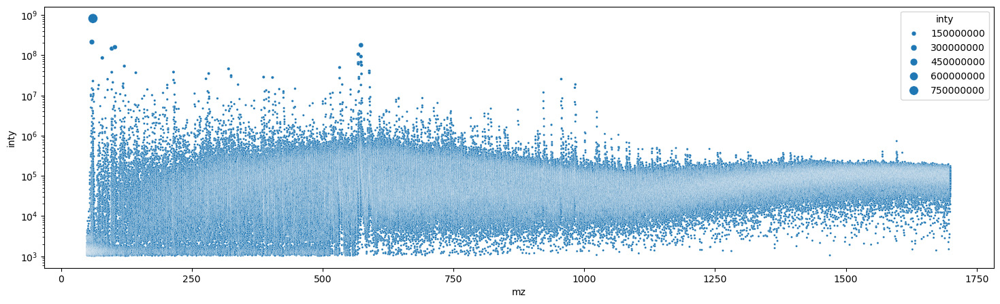

In [15]:
all_merged_df = merged_exp.get_df(long=True)[["mz", "inty"]]
sns_plot(all_merged_df["mz"], all_merged_df["inty"], xlim=None, ylim=None, plottype="scatter",
         size=all_merged_df["inty"], log=["y"], sizes=(5, 100))   # distinct: tab10, continous: hls

In [18]:
dynamic_plot(load_experiment(os.path.join(run_dir, "merged_all.mzML")), log=[])